In [1]:
from __future__ import division, print_function

import numpy as np

from astropy import units as u
from astropy import constants as cnst
from astropy.io import fits
from astropy import convolution

import make_color

In [12]:
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import rcParams

rcParams['figure.figsize'] = (12, 10)
rcParams['image.interpolation'] = 'none'
rcParams['image.origin'] = 'lower'
rcParams['image.cmap'] = 'viridis'

# Setup 

In [3]:
f6band = np.loadtxt('wfc_F606W.dat')
f6band = (f6band[:, 0]*u.angstrom, f6band[:, 1])
f8band = np.loadtxt('wfc_F814W.dat')
f8band = (f8band[:, 0]*u.angstrom, f8band[:, 1])

In [4]:
Ts = np.logspace(2.75,5,250)*u.K

In [5]:
Tratios, ratios, leff6, leff8 = make_color.compute_T_ratio_grid(Ts, f6band, f8band)

/Users/erik/miniconda3/envs/anaconda2/lib/python2.7/site-packages/astropy/units/quantity.py:822: RuntimeWarning: divide by zero encountered in true_divide
  return super(Quantity, self).__truediv__(other)
/Users/erik/miniconda3/envs/anaconda2/lib/python2.7/site-packages/astropy/units/quantity.py:822: RuntimeWarning: invalid value encountered in true_divide
  return super(Quantity, self).__truediv__(other)


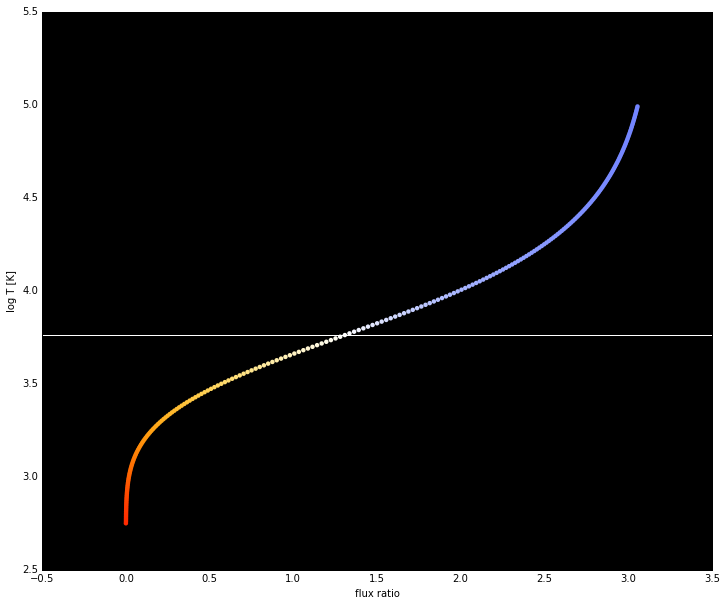

In [6]:
make_color.band_ratio_plot(Ts, f6band, f8band, False)

make_color.py:90: RuntimeWarning: divide by zero encountered in log10
  ratio = -2.5*np.log10(ratio)


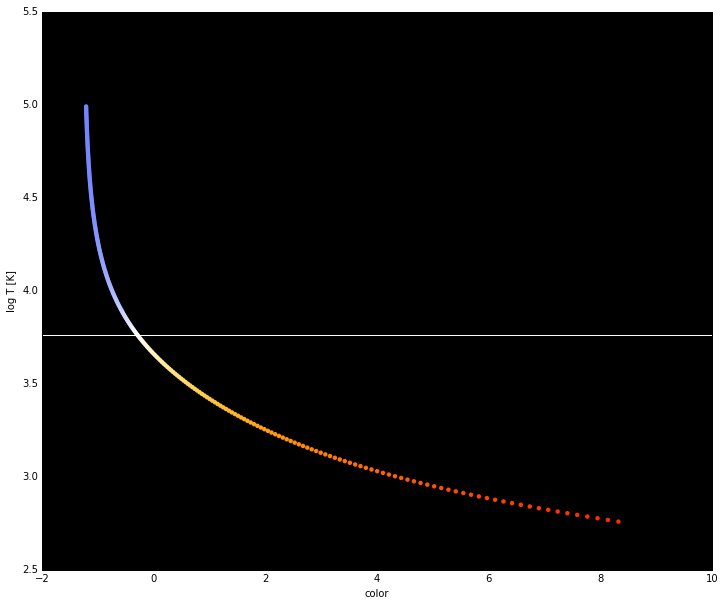

In [7]:
make_color.band_ratio_plot(Ts, f6band, f8band, True)

# Experimenting with Pisc A

In [8]:
ls drizzled_PiscA_F606W 

ACSWFC_2048x4096_1_staticMask.fits  jclj01tvq_single_wht.fits
ACSWFC_2048x4096_2_staticMask.fits  jclj01tvq_skymatch_mask_sci1.fits
PiscA_F606W_drc_ctx.fits            jclj01tvq_skymatch_mask_sci2.fits
PiscA_F606W_drc_sci.fits            jclj01twq_flc.fits
PiscA_F606W_drc_wht.fits            jclj01twq_sci1_blt.fits
PiscA_F606W_med.fits                jclj01twq_sci1_crmask.fits
astrodrizzle.log                    jclj01twq_sci1_final_mask.fits
jclj01tvq_flc.fits                  jclj01twq_sci1_single_mask.fits
jclj01tvq_sci1_blt.fits             jclj01twq_sci2_blt.fits
jclj01tvq_sci1_crmask.fits          jclj01twq_sci2_crmask.fits
jclj01tvq_sci1_final_mask.fits      jclj01twq_sci2_final_mask.fits
jclj01tvq_sci1_single_mask.fits     jclj01twq_sci2_single_mask.fits
jclj01tvq_sci2_blt.fits             jclj01twq_single_sci.fits
jclj01tvq_sci2_crmask.fits          jclj01twq_single_wht.fits
jclj01tvq_sci2_final_mask.fits      jclj01twq_skymatch_mask_sci1.fits
jclj01tvq_sci2_single_mask.fits  

In [9]:
f6hdu = fits.open('drizzled_PiscA_F606W/PiscA_F606W_drc_sci.fits')[0]
f6img = f6hdu.data
f8hdu = fits.open('drizzled_PiscA_F814W/PiscA_F814W_drc_sci.fits')[0]
f8img = f8hdu.data
combhdu = fits.open('drizzled_PiscA_allfilters_ivm/PiscA_allfilters_ivm_drc_sci.fits')[0]
combimg = combhdu.data

ratioimg = f6img/f8img

testsubimg = (slice(4900,5900),slice(3100,4100))

-c:8: RuntimeWarning: divide by zero encountered in true_divide
-c:8: RuntimeWarning: invalid value encountered in true_divide


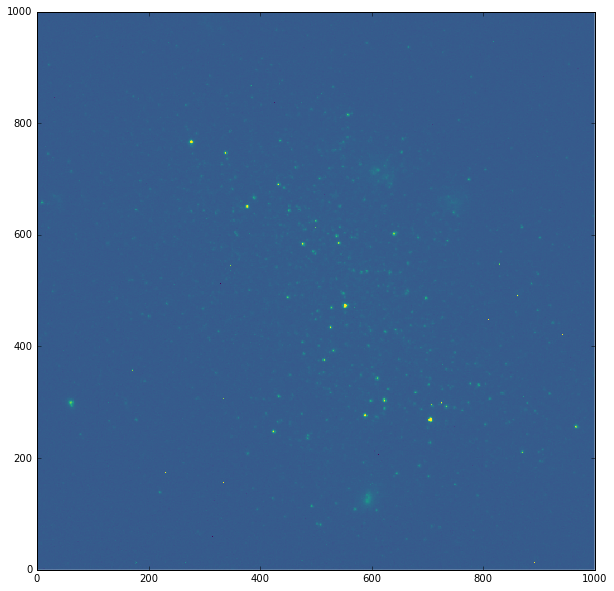

In [13]:
plt.imshow(combimg[testsubimg],vmin=-.2,vmax=.5)
None

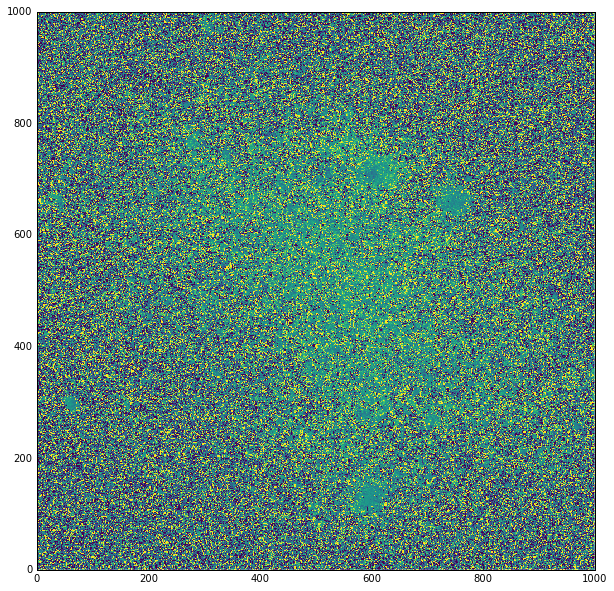

In [14]:
plt.imshow(ratioimg[testsubimg],vmin=-1,vmax=3)
None

In [15]:
Timgs = np.interp(ratioimg,ratios,Tratios,left=-1,right=-2)*u.K

-c:1: RuntimeWarning: invalid value encountered in log10


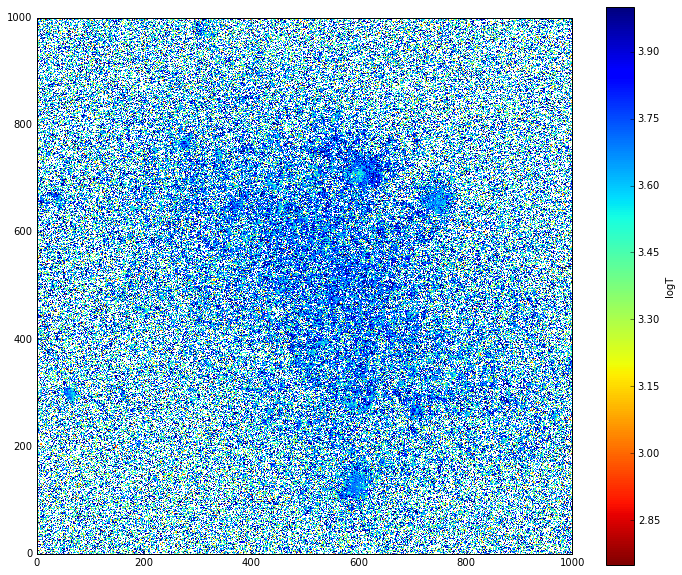

In [16]:
plt.imshow(np.log10(np.ma.masked_less_equal(Timgs.value,0)[testsubimg]),cmap=plt.cm.jet_r,vmax=4)
plt.colorbar().set_label('logT')

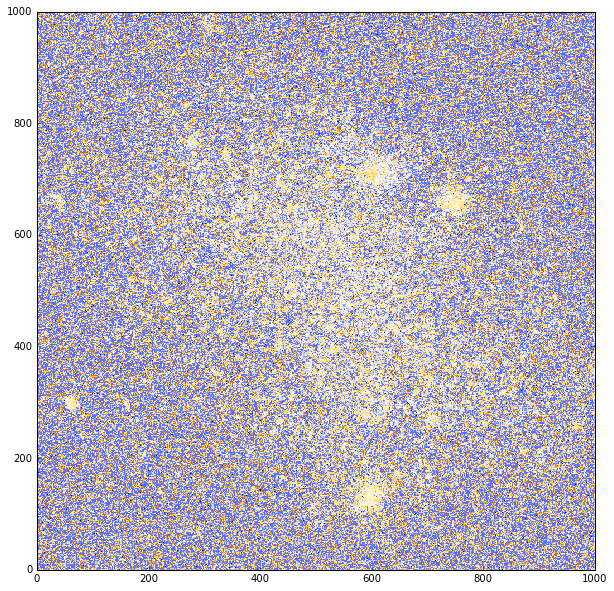

In [17]:
colorimg = make_color.T_to_rgb(Timgs[testsubimg],normedat=5800*u.K)
plt.imshow(colorimg)

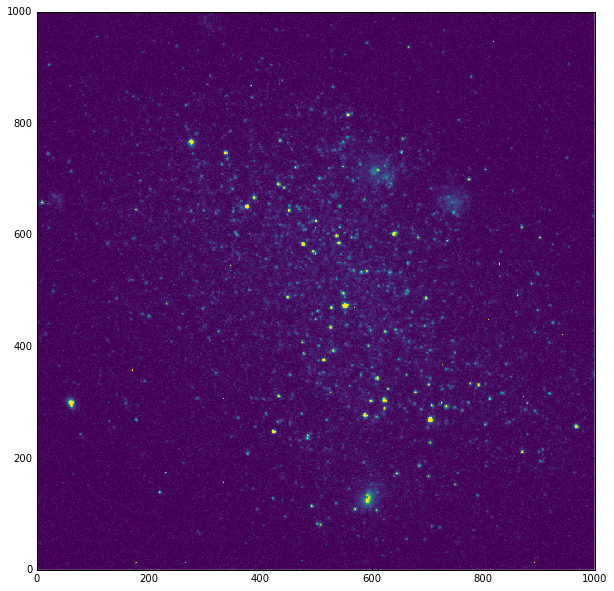

In [18]:
rescaledcomb = make_color.rescale(combimg[testsubimg], .0, .15, lowerfill=0,upperfill=1)
plt.imshow(rescaledcomb)
None

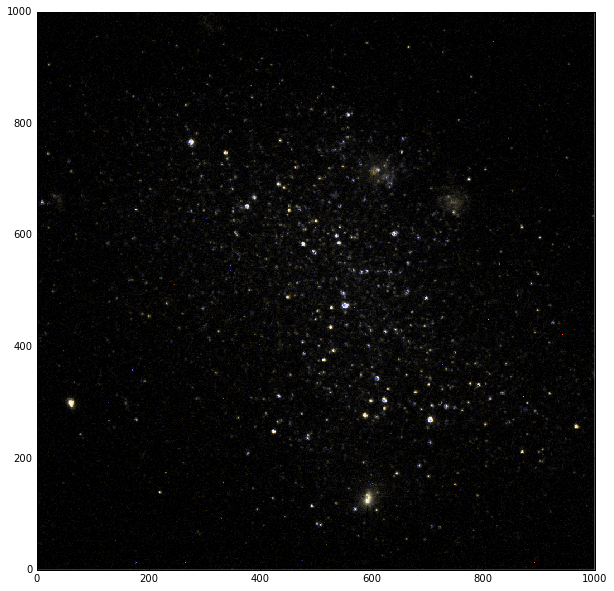

In [19]:
plt.imshow(make_color.modulate_color_image(colorimg, rescaledcomb))

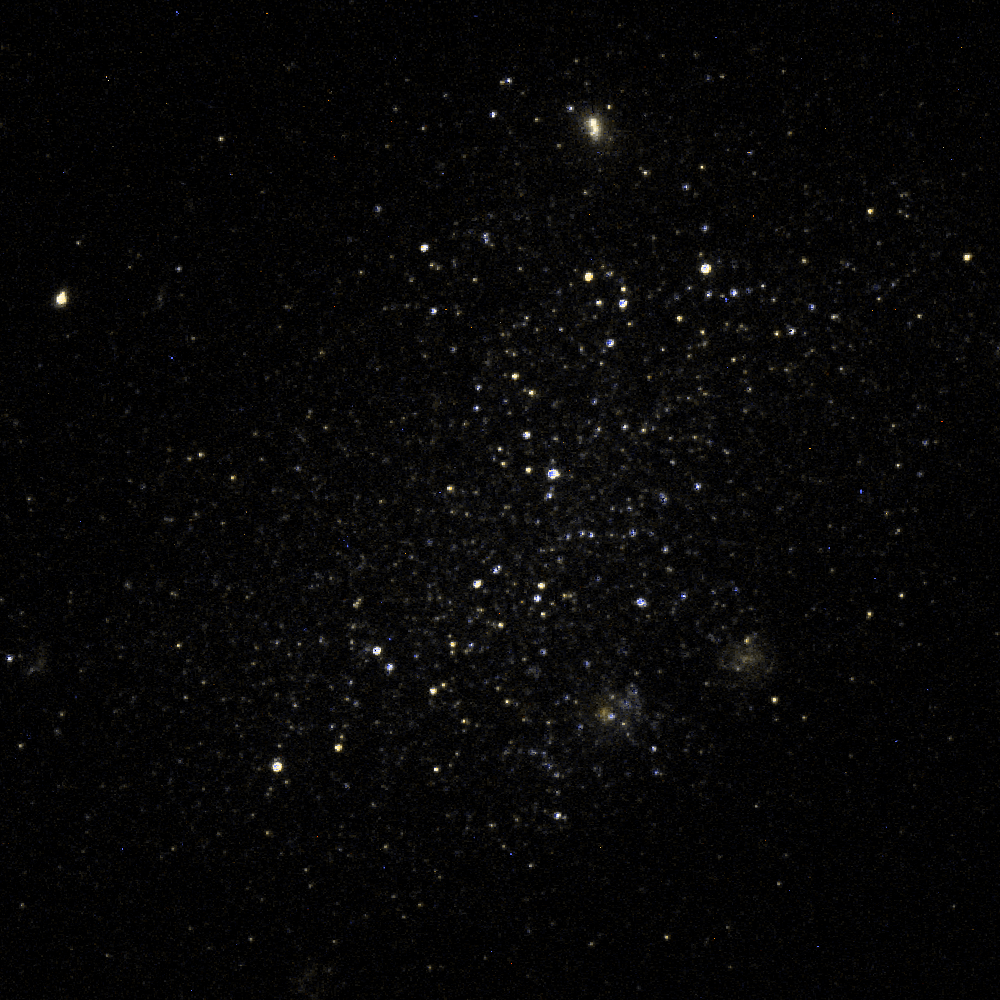

In [20]:
make_color.floatarr_to_image(make_color.modulate_color_image(colorimg, rescaledcomb), 'test.png')

In [210]:
msk = ((Timgs.value<2500)|~np.isfinite(Timgs.value))[testsubimg]
fixcomb = rescaledcomb.copy()
fixcomb[msk] = 0
k = convolution.Gaussian2DKernel(1)
k.array[k.shape[0]//2,k.shape[0]//2] = 0
cimg = convolution.convolve(fixcomb,convolution.Gaussian2DKernel(1), normalize_kernel=True)

fixcomb[msk] = cimg[msk]

<PIL.Image.Image image mode=RGB size=1000x1000 at 0x19EF4A320>

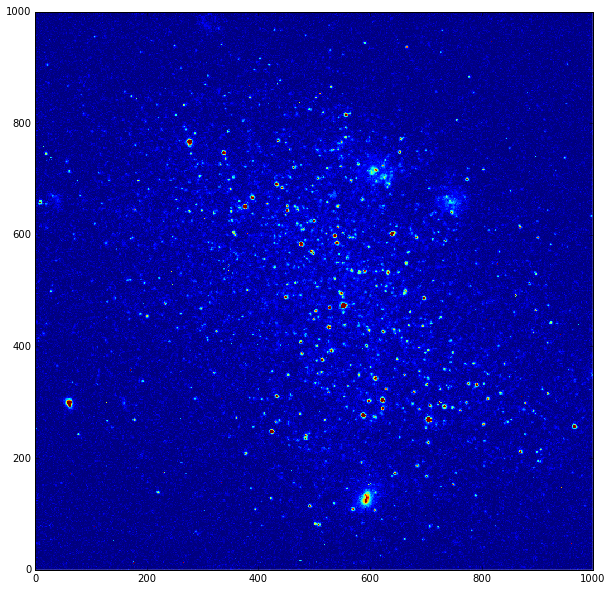

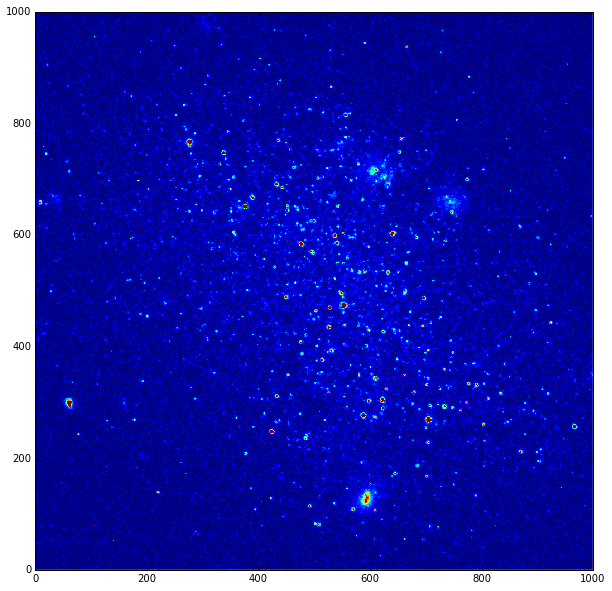

In [211]:
plt.figure()
plt.imshow(rescaledcomb)
plt.figure()
plt.imshow(fixcomb)
make_color.floatarr_to_image(make_color.modulate_color_image(colorimg, fixcomb), 'test2.png')

In [ ]:
f6hdu = fits.open('drizzled_PiscA_F606W/PiscA_F606W_drc_sci.fits')[0]
f6img = f6hdu.data
f8hdu = fits.open('drizzled_PiscA_F814W/PiscA_F814W_drc_sci.fits')[0]
f8img = f8hdu.data
combhdu = fits.open('drizzled_PiscA_allfilters_ivm/PiscA_allfilters_ivm_drc_sci.fits')[0]

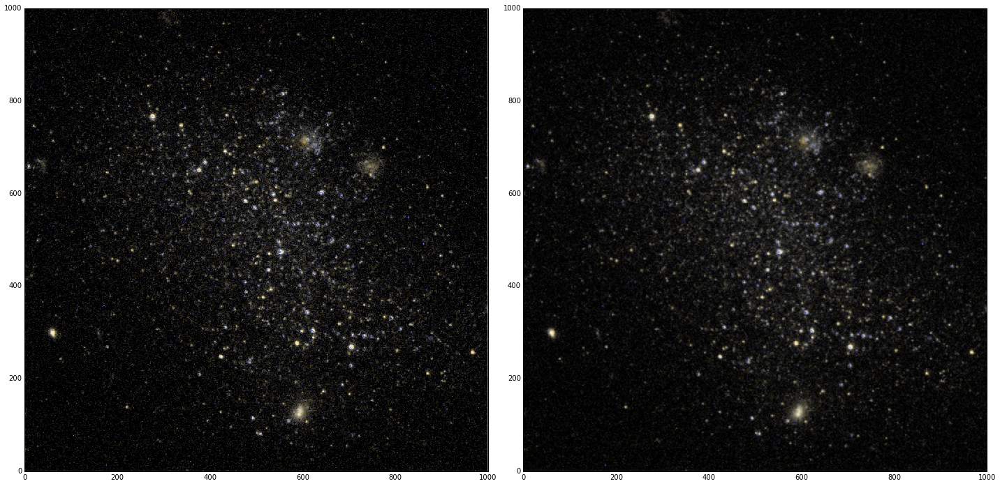

In [278]:
rescaledcomb2 = make_color.rescale(combimg[testsubimg], -.0, .2, lowerfill=0,upperfill=1,postfunc=lambda x:np.arcsinh(x*10)/np.pi)
combined = make_color.modulate_color_image(colorimg, rescaledcomb2)
convs = [convolution.convolve(combined[:,:,i], convolution.Gaussian2DKernel(.8)) for i in range(3)]

plt.figure(figsize=(20,15))
plt.subplot(1,2,1)
plt.imshow(combined)
plt.subplot(1,2,2)
plt.imshow(np.array(convs).transpose(1,2,0))
plt.tight_layout()

# "Production" runs

In [238]:
reload(make_color)
res=make_color.prettify_acs_image('drizzled_PiscA_F606W/PiscA_F606W_drc_sci.fits',
                   'drizzled_PiscA_F814W/PiscA_F814W_drc_sci.fits',
                   'drizzled_PiscA_allfilters_ivm/PiscA_allfilters_ivm_drc_sci.fits',
                   'prettypics/PiscA_for_frame.png',
                   rescalelower=0., rescaleupper=.15,
                   msk=(slice(4700,6700),slice(1000,4500)))

Loading data
Masking data
Computing flux ratio
Interpolating ratios to temperatures
Converting to RGB
Convolving and cleaning
('Saving to', 'testA.png')


In [9]:
reload(make_color)
res=make_color.prettify_acs_image('drizzled_PiscA_F606W/PiscA_F606W_drc_sci.fits',
                   'drizzled_PiscA_F814W/PiscA_F814W_drc_sci.fits',
                   'drizzled_PiscA_allfilters_ivm/PiscA_allfilters_ivm_drc_sci.fits',
                   'prettypics/PiscA_asinh.png',
                   rescalefunc=lambda x:np.arcsinh(x*10)/np.pi,
                   rescalelower=0., rescaleupper=.15,
                   msk=(slice(4700,6700),slice(1000,4500)))

Loading data
Masking data
Computing flux ratio
Interpolating ratios to temperatures
Converting to RGB
Convolving and cleaning
('Saving to', 'prettypics/PiscA_asinh.png')


In [239]:
res=make_color.prettify_acs_image('drizzled_PiscB_F606W/PiscB_F606W_drc_sci.fits',
                   'drizzled_PiscB_F814W/PiscB_F814W_drc_sci.fits',
                   'drizzled_PiscB_allfilters_ivm/PiscB_allfilters_ivm_drc_sci.fits',
                   'prettypics/PiscB_for_frame.png',
                   rescalelower=0., rescaleupper=.2,
                   msk=(slice(5000,6400),slice(3100,5300)))

Loading data
Masking data
Computing flux ratio
Interpolating ratios to temperatures
Converting to RGB
Convolving and cleaning
('Saving to', 'prettypics/PiscB_for_frame.png')


In [261]:
res=make_color.prettify_acs_image('drizzled_PiscB_F606W/PiscB_F606W_drc_sci.fits',
                   'drizzled_PiscB_F814W/PiscB_F814W_drc_sci.fits',
                   'drizzled_PiscB_allfilters_ivm/PiscB_allfilters_ivm_drc_sci.fits',
                   'prettypics/PiscB_for_frame_asinh.png',
                   rescalelower=0., rescaleupper=.2,
                   rescalefunc=lambda x:np.arcsinh(x*10)/np.pi,
                   msk=(slice(5000,6400),slice(3100,5300)))


Loading data
Masking data
Computing flux ratio
Interpolating ratios to temperatures
Converting to RGB
Convolving and cleaning
('Saving to', 'prettypics/PiscB_for_frame_asinh.png')


In [289]:
reload(make_color)
res=make_color.prettify_acs_image('drizzled_PiscB_F606W/PiscB_F606W_drc_sci.fits',
                   'drizzled_PiscB_F814W/PiscB_F814W_drc_sci.fits',
                   'drizzled_PiscB_allfilters_ivm/PiscB_allfilters_ivm_drc_sci.fits',
                   'prettypics/PiscB_for_frame_asinh_smooth.png',
                   rescalelower=0., rescaleupper=.2,
                   rescalefunc=lambda x:np.arcsinh(x*10)/np.pi,
                   msk=(slice(5000,6400),slice(3100,5300)),
                   finalsmoothkernel=convolution.Gaussian2DKernel(.8),
                   _shortcutcolorimg=res['colorimg'])


Loading data
Masking data
Computing flux ratio
Interpolating ratios to temperatures
Using supplied colorimg... might be inconsistent!
Convolving and cleaning
Doing final smoothing
('Saving to', 'prettypics/PiscB_for_frame_asinh_smooth.png')


## 8x10 versions

In [294]:
v1ratio = ((6400-5000)/(5300-3100))
v1ratio

0.6363636363636364

In [299]:
newextent=(8/10/v1ratio)*(6400-5000)
5000+newextent, 5900-newextent/2, 5900+newextent/2,

(6760.0, 5020.0, 6780.0)

In [300]:
(6760 - 5000)/(5300-3100)

0.8

In [302]:
extent = (slice(5000,6760),slice(3100,5300))
res=make_color.prettify_acs_image('drizzled_PiscB_F606W/PiscB_F606W_drc_sci.fits',
                   'drizzled_PiscB_F814W/PiscB_F814W_drc_sci.fits',
                   'drizzled_PiscB_allfilters_ivm/PiscB_allfilters_ivm_drc_sci.fits',
                   'prettypics/PiscB_for_frame_asinh_8x10.png',
                   rescalelower=0., rescaleupper=.2,
                   rescalefunc=lambda x:np.arcsinh(x*10)/np.pi,
                   msk=extent)
res=make_color.prettify_acs_image('drizzled_PiscB_F606W/PiscB_F606W_drc_sci.fits',
                   'drizzled_PiscB_F814W/PiscB_F814W_drc_sci.fits',
                   'drizzled_PiscB_allfilters_ivm/PiscB_allfilters_ivm_drc_sci.fits',
                   'prettypics/PiscB_for_frame2_8x10.png',
                   rescalelower=0., rescaleupper=.15,
                   msk=extent)

Loading data
Masking data
Computing flux ratio
Interpolating ratios to temperatures
Converting to RGB
Convolving and cleaning
('Saving to', 'prettypics/PiscB_for_frame_asinh_8x10.png')
Loading data
Masking data
Computing flux ratio
Interpolating ratios to temperatures
Converting to RGB
Convolving and cleaning
('Saving to', 'prettypics/PiscB_for_frame_8x10.png')


In [303]:

res=make_color.prettify_acs_image('drizzled_PiscB_F606W/PiscB_F606W_drc_sci.fits',
                   'drizzled_PiscB_F814W/PiscB_F814W_drc_sci.fits',
                   'drizzled_PiscB_allfilters_ivm/PiscB_allfilters_ivm_drc_sci.fits',
                   'prettypics/PiscB_for_frame_8x10.png',
                   rescalelower=0., rescaleupper=.2,
                   msk=extent)

Loading data
Masking data
Computing flux ratio
Interpolating ratios to temperatures
Converting to RGB
Convolving and cleaning
('Saving to', 'prettypics/PiscB_for_frame2_8x10.png')


## Larger, subsampled versions

In [16]:
res=make_color.prettify_acs_image('drizzled_PiscA_F606W/PiscA_F606W_drc_sci.fits',
                   'drizzled_PiscA_F814W/PiscA_F814W_drc_sci.fits',
                   'drizzled_PiscA_allfilters_ivm/PiscA_allfilters_ivm_drc_sci.fits',
                   'prettypics/PiscA_asinh_subsampled2x.png',
                   rescalefunc=lambda x:np.arcsinh(x*10)/np.pi,
                   rescalelower=0., rescaleupper=.15,
                   msk=(slice(5400-1200, 5400+1200, 2),slice(3700-1200,3700+1200, 2)))

Loading data
Masking data
Computing flux ratio
Interpolating ratios to temperatures
Converting to RGB
Convolving and cleaning
('Saving to', 'prettypics/PiscA_asinh_subsampled2x.png')


In [17]:
res=make_color.prettify_acs_image('drizzled_PiscB_F606W/PiscB_F606W_drc_sci.fits',
                   'drizzled_PiscB_F814W/PiscB_F814W_drc_sci.fits',
                   'drizzled_PiscB_allfilters_ivm/PiscB_allfilters_ivm_drc_sci.fits',
                   'prettypics/PiscB_asinh_subsampled2x.png',
                   rescalelower=0., rescaleupper=.2,
                   rescalefunc=lambda x:np.arcsinh(x*10)/np.pi,
                   msk=(slice(5900-1200,5900+1200, 2),slice(4300-1200,4300+1200, 2)))

Loading data
Masking data
Computing flux ratio
Interpolating ratios to temperatures
Converting to RGB
Convolving and cleaning
('Saving to', 'prettypics/PiscB_asinh_subsampled2x.png')


### For Zolt 

In [ ]:
res=make_color.prettify_acs_image('drizzled_PiscA_F606W/PiscA_F606W_drc_sci.fits',
                   'drizzled_PiscA_F814W/PiscA_F814W_drc_sci.fits',
                   'drizzled_PiscA_allfilters_ivm/PiscA_allfilters_ivm_drc_sci.fits',
                   'prettypics/PiscA_asinh_big.png',
                   rescalefunc=lambda x:np.arcsinh(x*10)/np.pi,
                   rescalelower=0., rescaleupper=.15,
                   msk=(slice(4700,6700),slice(1000,4500)))

In [ ]:
res=make_color.prettify_acs_image('drizzled_PiscB_F606W/PiscB_F606W_drc_sci.fits',
                   'drizzled_PiscB_F814W/PiscB_F814W_drc_sci.fits',
                   'drizzled_PiscB_allfilters_ivm/PiscB_allfilters_ivm_drc_sci.fits',
                   'prettypics/PiscB_asinh_big.png',
                   rescalelower=0., rescaleupper=.2,
                   rescalefunc=lambda x:np.arcsinh(x*10)/np.pi,
                   msk=(slice(5000,6400),slice(3100,5300)))